In [146]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import plotly.express as px
import pickle

### Loading the Dataset

In [2]:
df = pd.read_excel('Copper_Set.xlsx')
df.head()

,id,item_date,quantity tons,customer,country,status,item type,application,thickness,width,material_ref,product_ref,delivery date,selling_price
0,EC06F063-9DF0-440C-8764-0B0C05A4F6AE,20210401.0,54.151139,30156308.0,28.0,Won,W,10.0,2.00,1500.0,DEQ1 S460MC,1670798778,20210701.0,854.00
1,4E5F4B3D-DDDF-499D-AFDE-A3227EC49425,20210401.0,768.024839,30202938.0,25.0,Won,W,41.0,0.80,1210.0,0000000000000000000000000000000000104991,1668701718,20210401.0,1047.00
2,E140FF1B-2407-4C02-A0DD-780A093B1158,20210401.0,386.127949,30153963.0,30.0,Won,WI,28.0,0.38,952.0,S0380700,628377,20210101.0,644.33
3,F8D507A0-9C62-4EFE-831E-33E1DA53BB50,20210401.0,202.411065,30349574.0,32.0,Won,S,59.0,2.30,1317.0,DX51D+ZM310MAO 2.3X1317,1668701718,20210101.0,768.00
4,4E1C4E78-152B-430A-8094-ADD889C9D0AD,20210401.0,785.526262,30211560.0,28.0,Won,W,10.0,4.00,2000.0,2_S275JR+AR-CL1,640665,20210301.0,577.00


In [3]:
df.shape

(181673, 14)

### We are taking only the Data whose feature Status contains won and lost

In [4]:
df = df[(df['status'] == 'Won') | (df['status'] == 'Lost')]
df.head()

,id,item_date,quantity tons,customer,country,status,item type,application,thickness,width,material_ref,product_ref,delivery date,selling_price
0,EC06F063-9DF0-440C-8764-0B0C05A4F6AE,20210401.0,54.151139,30156308.0,28.0,Won,W,10.0,2.00,1500.0,DEQ1 S460MC,1670798778,20210701.0,854.00
1,4E5F4B3D-DDDF-499D-AFDE-A3227EC49425,20210401.0,768.024839,30202938.0,25.0,Won,W,41.0,0.80,1210.0,0000000000000000000000000000000000104991,1668701718,20210401.0,1047.00
2,E140FF1B-2407-4C02-A0DD-780A093B1158,20210401.0,386.127949,30153963.0,30.0,Won,WI,28.0,0.38,952.0,S0380700,628377,20210101.0,644.33
3,F8D507A0-9C62-4EFE-831E-33E1DA53BB50,20210401.0,202.411065,30349574.0,32.0,Won,S,59.0,2.30,1317.0,DX51D+ZM310MAO 2.3X1317,1668701718,20210101.0,768.00
4,4E1C4E78-152B-430A-8094-ADD889C9D0AD,20210401.0,785.526262,30211560.0,28.0,Won,W,10.0,4.00,2000.0,2_S275JR+AR-CL1,640665,20210301.0,577.00


In [5]:
df.shape

(150448, 14)

### Checking for the datatypes if anything is different we have to change it

In [6]:
df.dtypes

id                object
item_date        float64
quantity tons     object
customer         float64
country          float64
status            object
item type         object
application      float64
thickness        float64
width            float64
material_ref      object
product_ref        int64
delivery date    float64
selling_price    float64
dtype: object

### Here ***'item_date'*** and ***'delivery date'*** are as floats we are converting them into datetime datatypes

In [7]:
def date_coversion(x):
    try:
       return pd.to_datetime(x,format='%Y%m%d').date()
    except:
        return np.nan

In [8]:
df['item_date'] = df['item_date'].apply(lambda x: date_coversion(x))

In [9]:
df['delivery date'] = df['delivery date'].apply(lambda x: date_coversion(x))

In [10]:
df['item_date'] = df['item_date'].astype('datetime64[ns]')
df['delivery date'] = df['delivery date'].astype('datetime64[ns]')

### ***'quantity tons'*** have to be converted into float

In [11]:
def float_coversion(x):
    try:
       return float(x)
    except:
        return np.nan

In [12]:
df['quantity tons'] = df['quantity tons'].apply(lambda x: float_coversion(x))

### Now we changed the data type of every columns

In [13]:
df.dtypes

id                       object
item_date        datetime64[ns]
quantity tons           float64
customer                float64
country                 float64
status                   object
item type                object
application             float64
thickness               float64
width                   float64
material_ref             object
product_ref               int64
delivery date    datetime64[ns]
selling_price           float64
dtype: object

### As per the problem statement we have to change values of the ***'material_ref'*** to null if the value has '00000' at the begining

In [14]:
df['material_ref'] = df['material_ref'].apply(lambda x: x if '00000' != str(x)[:5] else np.nan)

### Null Value Treatment and Data cleaning

In [15]:
df.isnull().sum()

id                   1
item_date            3
quantity tons        1
customer             1
country              4
status               0
item type            0
application          3
thickness            0
width                0
material_ref     82418
product_ref          0
delivery date        2
selling_price        1
dtype: int64

In [16]:
df.isnull().sum() / len(df) * 100

id                0.000665
item_date         0.001994
quantity tons     0.000665
customer          0.000665
country           0.002659
status            0.000000
item type         0.000000
application       0.001994
thickness         0.000000
width             0.000000
material_ref     54.781719
product_ref       0.000000
delivery date     0.001329
selling_price     0.000665
dtype: float64

In [17]:
df.shape

(150448, 14)

In [18]:
df.id.nunique()

150447

### Here we can see that null values in all the columns except ***'material_ref'*** is totaly 16 rows so we are dropping the columns because it won't affect the dataset

In [19]:
16 / 150448

0.00010634903754121025

In [20]:
df.dropna(subset=['id', 'item_date', 'quantity tons', 'customer', 'country', 'application', 'delivery date', 'selling_price'], inplace=True)

In [21]:
df.shape

(150435, 14)

### We see that ***'material_ref'*** has more than 82000 null values which is more than 50% we can drop that column

In [22]:
df.drop(columns=['material_ref'], inplace=True)

In [23]:
pd.set_option('display.max_rows', None) 
pd.set_option('display.max_columns', None)

In [24]:
df.isnull().sum()

id               0
item_date        0
quantity tons    0
customer         0
country          0
status           0
item type        0
application      0
thickness        0
width            0
product_ref      0
delivery date    0
selling_price    0
dtype: int64

In [25]:
df.country.value_counts()

country
78.0     28019
26.0     22617
25.0     20027
32.0     17804
27.0     13683
28.0     13178
84.0     10032
77.0      9111
30.0      7514
39.0      2760
79.0      1632
38.0      1302
40.0      1273
80.0       790
113.0      603
89.0        88
107.0        2
Name: count, dtype: int64

## Skewness Treatment - Log Transformation

In [26]:
def plot(df, column): 
    print(df[column].skew())
    plt.figure(figsize=(20,5)) 
    plt.subplot(1,3,1) 
    sns.boxplot(data=df, x=column) 
    plt.title(f'Box Plot for {column}') 
    plt.subplot(1,3,2) 
    sns.distplot(df[column]) 
    plt.title(f'Distribution Plot for {column}') 
    plt.subplot(1,3,3) 
    sns.violinplot(data=df, x=column) 
    plt.title(f'Violin Plot for {column}') 
    plt.show()

53.79515161908884


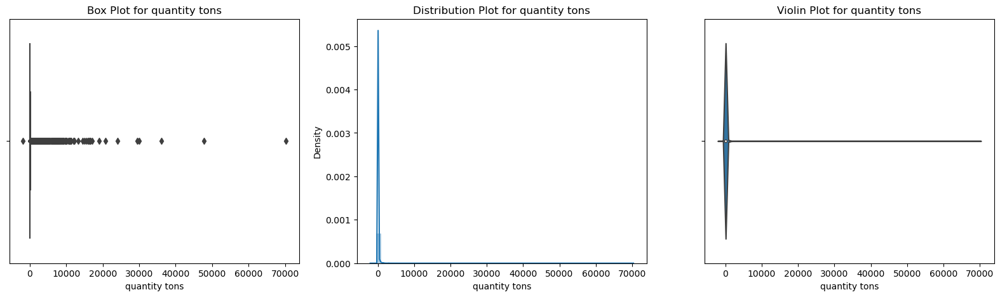

0.7509877955492849


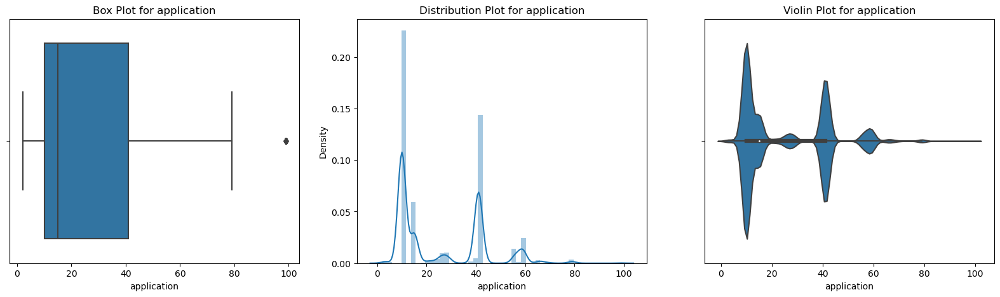

288.7021373752321


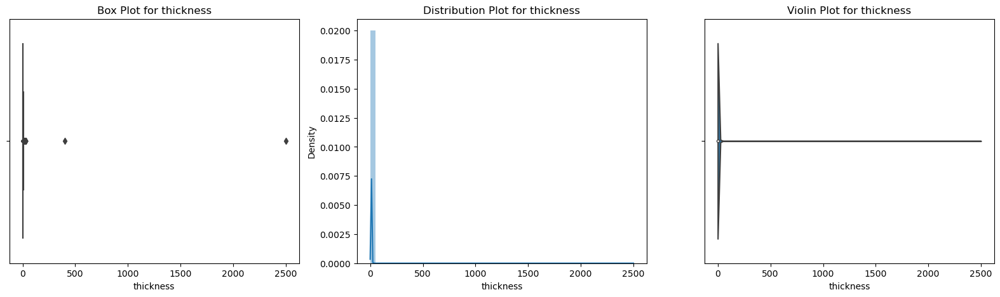

0.3527741333936263


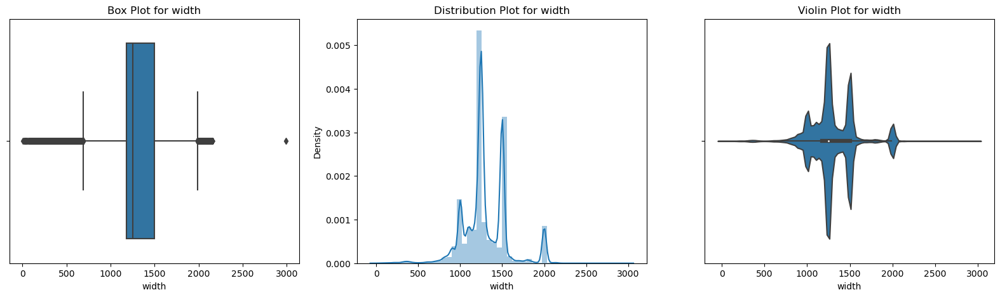

1.0134037117708559


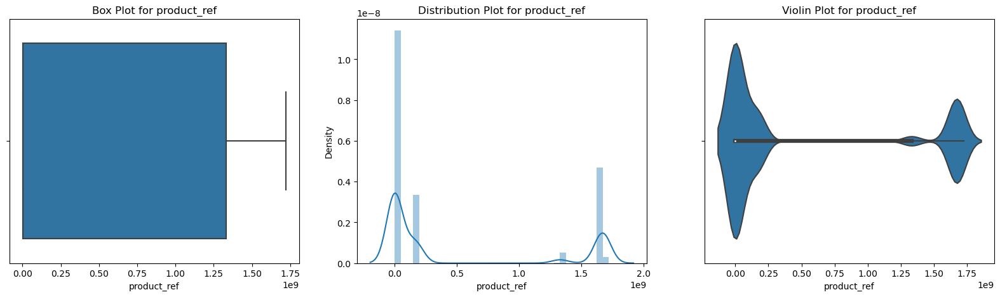

141.32687451443306


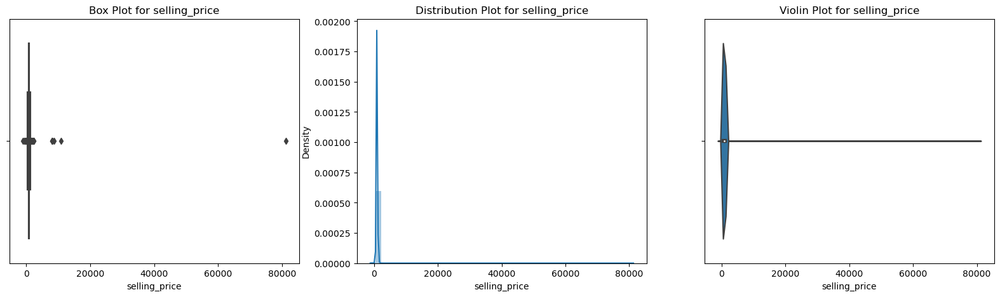

In [27]:
for i in ['quantity tons', 'application', 'thickness', 'width', 'product_ref', 'selling_price']:
    plot(df, i)

### Here we can see that ***'quantity tons'***, ***'thickness'*** & ***'selling_price'*** are heavily skewed so we are treating the skewness using Log transformation

In [28]:
df['quantity tons'][df['quantity tons'] <= 0]

105730      -4.0
181661     -18.0
181671   -2000.0
Name: quantity tons, dtype: float64

### We have to treat that values less than or equal to 0 because while encoding it may lead to *infinity* or *null*

In [29]:
df['quantity tons'] = df['quantity tons'].apply(lambda x: x if x > 0 else df['quantity tons'].median())

In [30]:
df['quantity tons'][df['quantity tons'] < 0]

Series([], Name: quantity tons, dtype: float64)

In [31]:
df['quantity_tons_log'] = np.log(df['quantity tons'])

In [32]:
df['thickness_log'] = np.log(df['thickness'])

In [33]:
df['selling_price'][df['selling_price'] < 0]

28       -1160.0
44761     -730.0
44810     -445.0
105189    -336.0
Name: selling_price, dtype: float64

### We are replacing those negative value with positive values of the same because they are all in the range

In [34]:
df['selling_price'] = df['selling_price'].apply(lambda x: -x if x < 0 else x)

In [35]:
df['selling_price'][df['selling_price'] < 0]

Series([], Name: selling_price, dtype: float64)

In [36]:
df.columns

Index(['id', 'item_date', 'quantity tons', 'customer', 'country', 'status',
       'item type', 'application', 'thickness', 'width', 'product_ref',
       'delivery date', 'selling_price', 'quantity_tons_log', 'thickness_log'],
      dtype='object')

In [37]:
df['selling_price'][df['selling_price'] == 0]

41    0.0
Name: selling_price, dtype: float64

### We are manual changing the value because it has only one value as 0 to avoid infintiy while log transforming

In [38]:
df.loc[41, 'selling_price'] = df['selling_price'].median()

In [39]:
df.loc[41, 'selling_price']

811.0

In [40]:
df['selling_price_log'] = np.log(df['selling_price'])

-0.05090491845608954


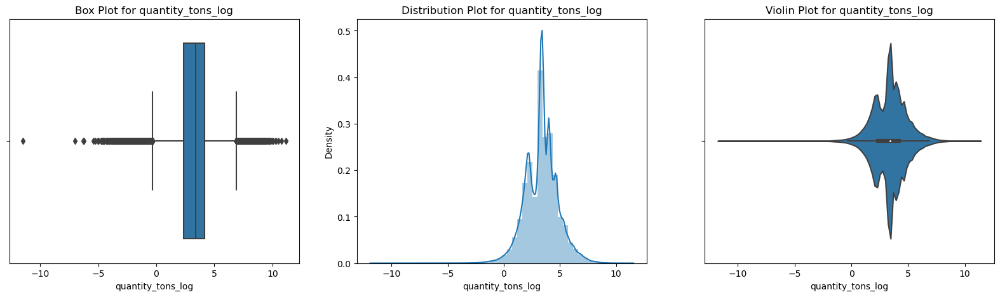

0.32952915962754814


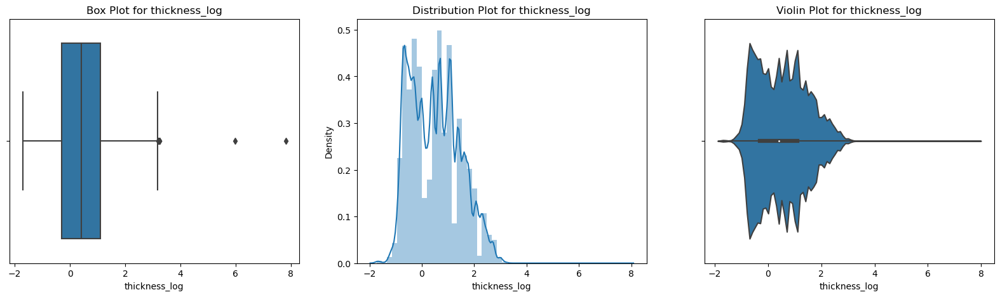

-0.3145065237796919


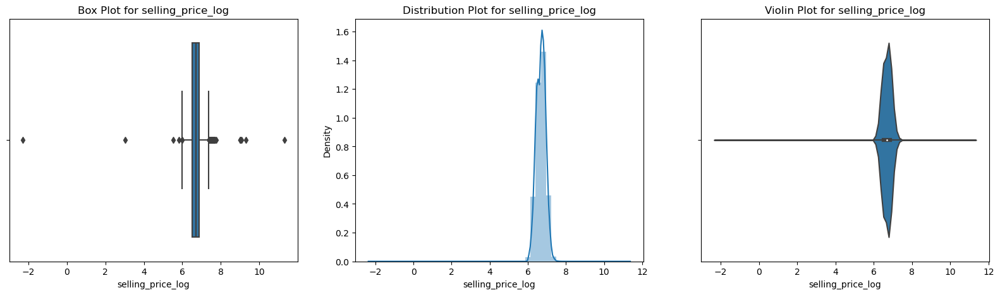

In [41]:
for i in ['quantity_tons_log', 'thickness_log', 'selling_price_log']:
    plot(df, i)

### Skewness has been treated using Log Transformation 

## Outliers Treatment - The Ouliers also be automaticaly treated along with the treatment of Skewness

### Now we are checking with correlation

In [42]:
df.columns

Index(['id', 'item_date', 'quantity tons', 'customer', 'country', 'status',
       'item type', 'application', 'thickness', 'width', 'product_ref',
       'delivery date', 'selling_price', 'quantity_tons_log', 'thickness_log',
       'selling_price_log'],
      dtype='object')

In [43]:
df.status.unique()

array(['Won', 'Lost'], dtype=object)

In [44]:
df.status = df.status.map({'Won': 1, 'Lost': 0})

In [45]:
df.dtypes

id                           object
item_date            datetime64[ns]
quantity tons               float64
customer                    float64
country                     float64
status                        int64
item type                    object
application                 float64
thickness                   float64
width                       float64
product_ref                   int64
delivery date        datetime64[ns]
selling_price               float64
quantity_tons_log           float64
thickness_log               float64
selling_price_log           float64
dtype: object

In [46]:
corr = df[['customer', 'country', 'application', 'width', 'product_ref', 'quantity_tons_log', 'thickness_log', 'status']].corr()
corr

,customer,country,application,width,product_ref,quantity_tons_log,thickness_log,status
customer,1.000000,0.089530,0.011579,0.044290,-0.034334,0.079419,0.070812,-0.047072
country,0.089530,1.000000,-0.035592,0.057074,-0.152594,-0.079883,-0.055531,0.094808
application,0.011579,-0.035592,1.000000,-0.213285,-0.116580,0.066479,-0.199998,0.177259
width,0.044290,0.057074,-0.213285,1.000000,-0.041627,0.036922,0.385431,-0.125950
product_ref,-0.034334,-0.152594,-0.116580,-0.041627,1.000000,0.053618,0.232449,-0.081092
quantity_tons_log,0.079419,-0.079883,0.066479,0.036922,0.053618,1.000000,0.034317,-0.115522
thickness_log,0.070812,-0.055531,-0.199998,0.385431,0.232449,0.034317,1.000000,-0.172014
status,-0.047072,0.094808,0.177259,-0.125950,-0.081092,-0.115522,-0.172014,1.000000


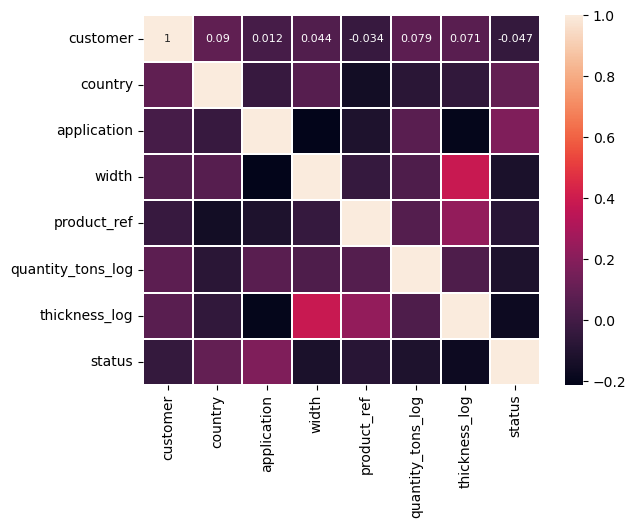

In [47]:
corr = df[['customer', 'country', 'application', 'width', 'product_ref', 'quantity_tons_log', 'thickness_log', 'status']].corr()
sns.heatmap(corr, annot=True, annot_kws={"size": 8}, linewidths=.3)
plt.show()

### We can see that every value is within the range so everything can be used for prediction

In [48]:
corr = df[['customer', 'country', 'application', 'width', 'product_ref', 'quantity_tons_log', 'thickness_log', 'selling_price_log']].corr()
corr

,customer,country,application,width,product_ref,quantity_tons_log,thickness_log,selling_price_log
customer,1.000000,0.089530,0.011579,0.044290,-0.034334,0.079419,0.070812,-0.014269
country,0.089530,1.000000,-0.035592,0.057074,-0.152594,-0.079883,-0.055531,-0.018443
application,0.011579,-0.035592,1.000000,-0.213285,-0.116580,0.066479,-0.199998,0.145829
width,0.044290,0.057074,-0.213285,1.000000,-0.041627,0.036922,0.385431,-0.177097
product_ref,-0.034334,-0.152594,-0.116580,-0.041627,1.000000,0.053618,0.232449,-0.080726
quantity_tons_log,0.079419,-0.079883,0.066479,0.036922,0.053618,1.000000,0.034317,-0.077052
thickness_log,0.070812,-0.055531,-0.199998,0.385431,0.232449,0.034317,1.000000,-0.467400
selling_price_log,-0.014269,-0.018443,0.145829,-0.177097,-0.080726,-0.077052,-0.467400,1.000000


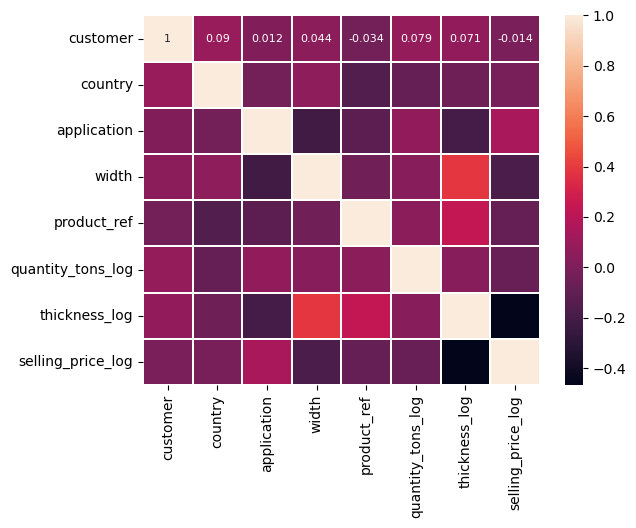

In [49]:
corr = df[['customer', 'country', 'application', 'width', 'product_ref', 'quantity_tons_log', 'thickness_log', 'selling_price_log']].corr()
sns.heatmap(corr, annot=True, annot_kws={"size": 8}, linewidths=.3)
plt.show()

### We can see that every value is within the range so everything can be used for classification

## Feature Engineering

In [50]:
df.columns

Index(['id', 'item_date', 'quantity tons', 'customer', 'country', 'status',
       'item type', 'application', 'thickness', 'width', 'product_ref',
       'delivery date', 'selling_price', 'quantity_tons_log', 'thickness_log',
       'selling_price_log'],
      dtype='object')

### Feature Encoding

In [51]:
df.dtypes

id                           object
item_date            datetime64[ns]
quantity tons               float64
customer                    float64
country                     float64
status                        int64
item type                    object
application                 float64
thickness                   float64
width                       float64
product_ref                   int64
delivery date        datetime64[ns]
selling_price               float64
quantity_tons_log           float64
thickness_log               float64
selling_price_log           float64
dtype: object

In [52]:
df['item type'].unique()

array(['W', 'WI', 'S', 'Others', 'PL', 'IPL', 'SLAWR'], dtype=object)

In [169]:
df['application'].unique()

array([10., 41., 28., 59., 15.,  4., 38., 56., 42., 26., 27., 19., 20.,
       66., 29., 22., 25., 40., 79.,  3., 99.,  2., 67.,  5., 39., 69.,
       70., 65., 58., 68.])

In [53]:
df.shape

(150435, 16)

### For ***'item type'*** we are doing the Mapping as it has only 6 categories

In [54]:
df['item_type_encode'] = df['item type'].map({'W': 1, 'WI': 2, 'S': 3, 'PL': 4, 'IPL': 5, 'SLAWR': 6, 'Others': 7})

In [55]:
df['item_type_encode'].unique()

array([1, 2, 3, 7, 4, 5, 6], dtype=int64)

In [56]:
df['item_type_encode'].value_counts()

item_type_encode
1    91951
3    52457
4     5032
2      504
7      463
5       27
6        1
Name: count, dtype: int64

### ***'id'*** Column contains unique values only so we can remove that column

In [57]:
df.id.nunique()

150435

In [58]:
df.shape

(150435, 17)

In [59]:
df.drop(columns=['id'], inplace=True)

### Since we have ***'item_date'*** and ***'delivery_date'*** we have to check for the date difference

In [60]:
date_diff = df[['item_date', 'delivery date']]

In [61]:
date_diff['date diff'] = (df['delivery date'] - df['item_date']).dt.days

In [62]:
date_diff[date_diff['date diff'] < 0]

,item_date,delivery date,date diff
2,2021-04-01,2021-01-01,-90
3,2021-04-01,2021-01-01,-90
4,2021-04-01,2021-03-01,-31
7,2021-04-01,2021-01-01,-90
11,2021-04-01,2021-01-01,-90
15,2021-04-01,2021-01-01,-90
19,2021-04-01,2021-01-01,-90
23,2021-04-01,2021-01-01,-90
122,2021-04-01,2021-03-01,-31
668,2021-03-31,2021-03-01,-30


In [63]:
len(date_diff[date_diff['date diff'] < 0])

14656

### We have negative number of days, so we have to treat with ML

In [64]:
df['date diff'] = (df['delivery date'] - df['item_date']).dt.days

### We have to split the data into positve date difference and negative difference

In [65]:
df_date_pos = df[df['date diff'] >= 0]

In [66]:
df_date_pos.shape

(135779, 17)

In [67]:
df_date_neg = df[df['date diff'] < 0]

In [68]:
df_date_neg.shape

(14656, 17)

In [69]:
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from xgboost import XGBRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split 
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [70]:
df_date_pos.columns

Index(['item_date', 'quantity tons', 'customer', 'country', 'status',
       'item type', 'application', 'thickness', 'width', 'product_ref',
       'delivery date', 'selling_price', 'quantity_tons_log', 'thickness_log',
       'selling_price_log', 'item_type_encode', 'date diff'],
      dtype='object')

In [71]:
def model_selection(df, algorithm):
    X = df[['quantity tons', 'customer', 'country', 'status', 'application', 'thickness', 'width', 'product_ref', 'selling_price', 'quantity_tons_log', 'thickness_log',
       'selling_price_log', 'item_type_encode']]
    y = df['date diff']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    model = algorithm().fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    r2_test = r2_score(y_test, y_pred)
    algo = str(algorithm).split("'")[1].split(".")[-1] 
    accuracy_metrics = {'algorithm' : algorithm.__name__, 'r2_score': r2_test, 'mae': mae, 'mse': mse} 
    return accuracy_metrics

### Select the suitable model for treating the date

In [72]:
models = [RandomForestRegressor, ExtraTreesRegressor, XGBRegressor, DecisionTreeRegressor]

In [73]:
for model in models:
    print(model_selection(df_date_pos, model))

{'algorithm': 'RandomForestRegressor', 'r2_score': 0.8512167177397486, 'mae': 8.723329650905878, 'mse': 229.64122223449695}
{'algorithm': 'ExtraTreesRegressor', 'r2_score': 0.8637096484504532, 'mae': 7.829923037266165, 'mse': 210.35886850419797}
{'algorithm': 'XGBRegressor', 'r2_score': 0.7519271247774473, 'mae': 14.13243671738232, 'mse': 382.89085577292883}
{'algorithm': 'DecisionTreeRegressor', 'r2_score': 0.725139590726545, 'mae': 9.476469288555016, 'mse': 424.23637501841216}


### We can see that every mmodel is performing good especially ***RandomForestRegressor***, ***ExtraTreesRegressor*** We are going to take ***Random Forest***

In [74]:
X = df_date_pos[['quantity tons', 'customer', 'country', 'status', 'application', 'thickness', 'width', 'product_ref', 'selling_price', 'quantity_tons_log', 'thickness_log',
   'selling_price_log', 'item_type_encode']]
y = df_date_pos['date diff']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [75]:
rf = RandomForestRegressor().fit(X_train, y_train)

In [76]:
df_date_neg.columns

Index(['item_date', 'quantity tons', 'customer', 'country', 'status',
       'item type', 'application', 'thickness', 'width', 'product_ref',
       'delivery date', 'selling_price', 'quantity_tons_log', 'thickness_log',
       'selling_price_log', 'item_type_encode', 'date diff'],
      dtype='object')

In [77]:
testing_data = df_date_neg.drop(columns=['item_date', 'delivery date', 'date diff', 'item type'])

In [78]:
y_pred = rf.predict(testing_data)

In [79]:
y_pred

array([42.21, 74.26, 63.33, ...,  5.67, 18.63, 16.57])

In [80]:
df_date_neg['date diff'] = np.round(y_pred)

In [81]:
df_date_neg.head()

,item_date,quantity tons,customer,country,status,item type,application,thickness,width,product_ref,delivery date,selling_price,quantity_tons_log,thickness_log,selling_price_log,item_type_encode,date diff
2,2021-04-01,386.127949,30153963.0,30.0,1,WI,28.0,0.38,952.0,628377,2021-01-01,644.33,5.956169,-0.967584,6.468211,2,42.0
3,2021-04-01,202.411065,30349574.0,32.0,1,S,59.0,2.30,1317.0,1668701718,2021-01-01,768.00,5.310301,0.832909,6.643790,3,74.0
4,2021-04-01,785.526262,30211560.0,28.0,1,W,10.0,4.00,2000.0,640665,2021-03-01,577.00,6.666354,1.386294,6.357842,1,63.0
7,2021-04-01,113.387124,30342192.0,32.0,1,W,41.0,0.68,1220.0,611993,2021-01-01,931.00,4.730808,-0.385662,6.836259,1,18.0
11,2021-04-01,113.995666,30342192.0,32.0,1,W,41.0,0.55,1220.0,611993,2021-01-01,954.00,4.736160,-0.597837,6.860664,1,18.0


### Now we treated the Date difference, now we are going to treat the ***'delivery date'***

In [82]:
df_date_neg.dtypes

item_date            datetime64[ns]
quantity tons               float64
customer                    float64
country                     float64
status                        int64
item type                    object
application                 float64
thickness                   float64
width                       float64
product_ref                   int64
delivery date        datetime64[ns]
selling_price               float64
quantity_tons_log           float64
thickness_log               float64
selling_price_log           float64
item_type_encode              int64
date diff                   float64
dtype: object

In [83]:
df_date_neg['delivery date'] = df_date_neg['item_date'] + pd.to_timedelta(df_date_neg['date diff'], unit='D')

In [84]:
df_date_neg.head()

,item_date,quantity tons,customer,country,status,item type,application,thickness,width,product_ref,delivery date,selling_price,quantity_tons_log,thickness_log,selling_price_log,item_type_encode,date diff
2,2021-04-01,386.127949,30153963.0,30.0,1,WI,28.0,0.38,952.0,628377,2021-05-13,644.33,5.956169,-0.967584,6.468211,2,42.0
3,2021-04-01,202.411065,30349574.0,32.0,1,S,59.0,2.30,1317.0,1668701718,2021-06-14,768.00,5.310301,0.832909,6.643790,3,74.0
4,2021-04-01,785.526262,30211560.0,28.0,1,W,10.0,4.00,2000.0,640665,2021-06-03,577.00,6.666354,1.386294,6.357842,1,63.0
7,2021-04-01,113.387124,30342192.0,32.0,1,W,41.0,0.68,1220.0,611993,2021-04-19,931.00,4.730808,-0.385662,6.836259,1,18.0
11,2021-04-01,113.995666,30342192.0,32.0,1,W,41.0,0.55,1220.0,611993,2021-04-19,954.00,4.736160,-0.597837,6.860664,1,18.0


### We  have changed  the ***'delivery date'*** and we are going to concatenate it

In [85]:
df_con = pd.concat([df_date_pos, df_date_neg])

In [86]:
df_con.reset_index(inplace = True)

In [87]:
df_con.drop(columns=['index','date diff'], inplace=True)

In [88]:
df_con.head()

,item_date,quantity tons,customer,country,status,item type,application,thickness,width,product_ref,delivery date,selling_price,quantity_tons_log,thickness_log,selling_price_log,item_type_encode
0,2021-04-01,54.151139,30156308.0,28.0,1,W,10.0,2.0,1500.0,1670798778,2021-07-01,854.0,3.991779,0.693147,6.749931,1
1,2021-04-01,768.024839,30202938.0,25.0,1,W,41.0,0.8,1210.0,1668701718,2021-04-01,1047.0,6.643822,-0.223144,6.953684,1
2,2021-04-01,225.790676,30202938.0,25.0,1,W,41.0,1.5,1265.0,1668701718,2021-04-01,983.0,5.419608,0.405465,6.890609,1
3,2021-04-01,69.071853,30341428.0,38.0,1,S,10.0,0.6,1275.0,1668701376,2021-07-01,1363.0,4.235147,-0.510826,7.217443,3
4,2021-04-01,630.626917,30202938.0,25.0,1,W,41.0,1.5,1165.0,1668701718,2021-04-01,983.0,6.446714,0.405465,6.890609,1


In [89]:
df_con.shape

(150435, 16)

### Now we add the date, month and year of item and delivery date

In [90]:
df_con['item_date_day'] = df_con['item_date'].dt.day
df_con['item_date_month'] = df_con['item_date'].dt.month
df_con['item_date_year'] = df_con['item_date'].dt.year

In [91]:
df_con['delivery day'] = df_con['delivery date'].dt.day
df_con['delivery month'] = df_con['delivery date'].dt.month
df_con['delivery year'] = df_con['delivery date'].dt.year

In [92]:
df_con.columns

Index(['item_date', 'quantity tons', 'customer', 'country', 'status',
       'item type', 'application', 'thickness', 'width', 'product_ref',
       'delivery date', 'selling_price', 'quantity_tons_log', 'thickness_log',
       'selling_price_log', 'item_type_encode', 'item_date_day',
       'item_date_month', 'item_date_year', 'delivery day', 'delivery month',
       'delivery year'],
      dtype='object')

In [93]:
df_con.drop(columns=['item_date', 'quantity tons', 'item type', 'thickness', 'delivery date', 'selling_price'], inplace=True)

In [94]:
df_con.shape

(150435, 16)

In [95]:
df_con.columns

Index(['customer', 'country', 'status', 'application', 'width', 'product_ref',
       'quantity_tons_log', 'thickness_log', 'selling_price_log',
       'item_type_encode', 'item_date_day', 'item_date_month',
       'item_date_year', 'delivery day', 'delivery month', 'delivery year'],
      dtype='object')

In [96]:
df_con.head()

,customer,country,status,application,width,product_ref,quantity_tons_log,thickness_log,selling_price_log,item_type_encode,item_date_day,item_date_month,item_date_year,delivery day,delivery month,delivery year
0,30156308.0,28.0,1,10.0,1500.0,1670798778,3.991779,0.693147,6.749931,1,1,4,2021,1,7,2021
1,30202938.0,25.0,1,41.0,1210.0,1668701718,6.643822,-0.223144,6.953684,1,1,4,2021,1,4,2021
2,30202938.0,25.0,1,41.0,1265.0,1668701718,5.419608,0.405465,6.890609,1,1,4,2021,1,4,2021
3,30341428.0,38.0,1,10.0,1275.0,1668701376,4.235147,-0.510826,7.217443,3,1,4,2021,1,7,2021
4,30202938.0,25.0,1,41.0,1165.0,1668701718,6.446714,0.405465,6.890609,1,1,4,2021,1,4,2021


In [172]:
df_con.customer.nunique()

1123

In [173]:
df_con['delivery year'].unique()

array([2021, 2022, 2020])

In [174]:
df_con['item_date_year'].unique()

array([2021, 2020])

In [97]:
df_con.to_excel('Copper Modelling.xlsx')

### Now we have completed the feature engineering, we are entering into ML part

# Classification Method - Status Prediction

In [98]:
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score, roc_curve

### As it is a classification problem we have to check the target variable is equally calssified or not

In [99]:
df_con['status'].value_counts()

status
1    116004
0     34431
Name: count, dtype: int64

<Axes: xlabel='status', ylabel='count'>

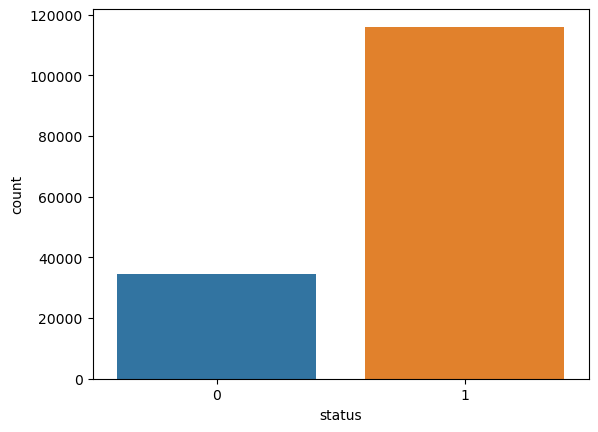

In [100]:
sns.countplot(x='status', data=df_con)

### We can see that it is not properly distributed so we are using sampling technique to treat them

In [101]:
from imblearn.over_sampling import RandomOverSampler
rm = RandomOverSampler()

In [126]:
X = df_con.drop(columns=['status', 'selling_price_log'])
y = df_con['status']

In [127]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(len(X_train), len(X_test), len(y_train), len(y_test))

120348 30087 120348 30087


In [130]:
y_train.value_counts()

status
1    92838
0    27510
Name: count, dtype: int64

In [128]:
X_resampled, y_resampled = rm.fit_resample(X_train, y_train)

In [129]:
y_resampled.value_counts()

status
0    92838
1    92838
Name: count, dtype: int64

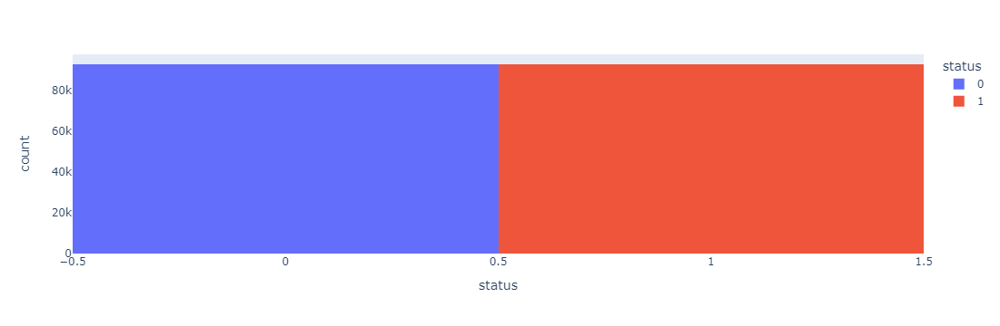

In [106]:
px.histogram(y_resampled, x='status', color='status')

### Over sample has been done and the 0 and 1 counts become same

### Model Selection

In [119]:
def model_selection(df, algorithm, X_res, X_test, y_res, y_test):
    model = algorithm().fit(X_res, y_res)
    y_pred_train = model.predict(X_res)
    y_pred_test = model.predict(X_test)
    acc_train = accuracy_score(y_res, y_pred_train)
    acc_test = accuracy_score(y_test, y_pred_test)
    accuracy_metrics = {'algorithm' : algorithm.__name__, 'accuracy_train': acc_train, 'accuracy_test': acc_test} 
    return accuracy_metrics

In [108]:
models = [RandomForestClassifier, ExtraTreesClassifier, XGBClassifier, DecisionTreeClassifier]

In [120]:
for model in models:
    print(model_selection(df_con, model, X_resampled, X_test, y_resampled, y_test))

{'algorithm': 'RandomForestClassifier', 'accuracy_train': 0.9999946142743273, 'accuracy_test': 0.9712500415461828}
{'algorithm': 'ExtraTreesClassifier', 'accuracy_train': 1.0, 'accuracy_test': 0.9744407883803636}
{'algorithm': 'XGBClassifier', 'accuracy_train': 0.9436491522867791, 'accuracy_test': 0.9224582045401668}
{'algorithm': 'DecisionTreeClassifier', 'accuracy_train': 1.0, 'accuracy_test': 0.9547977531824376}


### Considering the high testing accuracy and the robustness of ensemble methods to overfitting, both RandomForestClassifier and ExtraTreesClassifier are strong contenders. The decision between them may depend on additional factors such as computational efficiency, interpretability, and specific requirements of the problem domain. Overall, RandomForestClassifier and ExtraTreesClassifier are recommended choices for their strong performance and resilience to overfitting. 

### Eventhough we are selecting Random Forest and we are going to tune the hyper parameters

In [110]:
from sklearn.model_selection import GridSearchCV

### We selected Cross validation 5, n_jobs = -1 means it uses the all processors in this process

In [132]:
param_grid = {'max_depth' : [2, 5, 10, 20], 'min_samples_split': [2, 5, 10], 'min_samples_leaf' : [1, 2, 4], 'max_features' : ['sqrt', 'log2']} 
grid_search = GridSearchCV(estimator=RandomForestClassifier(), param_grid=param_grid, cv=5, n_jobs=-1) 
grid_search.fit(X_resampled, y_resampled)

GridSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': [2, 5, 10, 20],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10]})

In [133]:
grid_search.best_params_

{'max_depth': 20,
 'max_features': 'log2',
 'min_samples_leaf': 1,
 'min_samples_split': 2}

In [134]:
grid_search.best_estimator_

RandomForestClassifier(max_depth=20, max_features='log2')

In [135]:
best_grid=grid_search.best_estimator_

In [136]:
best_grid

RandomForestClassifier(max_depth=20, max_features='log2')

In [139]:
best_grid.fit(X_resampled, y_resampled)

RandomForestClassifier(max_depth=20, max_features='log2')

In [142]:
y_pred_test=best_grid.predict(X_test)
print(confusion_matrix(y_test,y_pred_test))
print("Accuracy Score {}".format(accuracy_score(y_test,y_pred_test)))
print("Classification report: {}".format(classification_report(y_test,y_pred_test)))

[[ 6680   241]
 [  977 22189]]
Accuracy Score 0.9595173995413302
Classification report:               precision    recall  f1-score   support

           0       0.87      0.97      0.92      6921
           1       0.99      0.96      0.97     23166

    accuracy                           0.96     30087
   macro avg       0.93      0.96      0.94     30087
weighted avg       0.96      0.96      0.96     30087



In [138]:
y_pred=best_grid.predict(X_train)
print(confusion_matrix(y_train,y_pred))
print("Accuracy Score {}".format(accuracy_score(y_train,y_pred)))
print("Classification report: {}".format(classification_report(y_train,y_pred)))

[[27509     1]
 [ 2119 90719]]
Accuracy Score 0.9823844185196264
Classification report:               precision    recall  f1-score   support

           0       0.93      1.00      0.96     27510
           1       1.00      0.98      0.99     92838

    accuracy                           0.98    120348
   macro avg       0.96      0.99      0.98    120348
weighted avg       0.98      0.98      0.98    120348



### now the overfitting have been reduced slightly

In [140]:
rf_fpr, rf_tpr, rf_threshold = roc_curve(y_test, best_grid.predict_proba(X_test)[:,1])

In [144]:
rf_auc = roc_auc_score(y_test, y_pred_test)
print(rf_auc)

0.9615022834572031


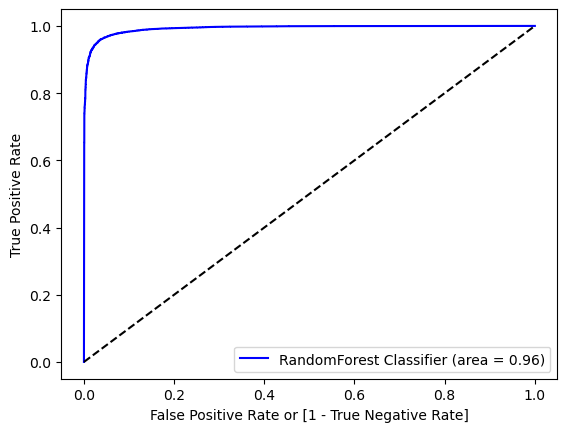

In [145]:
plt.plot(rf_fpr, rf_tpr, color='blue', label=f'RandomForest Classifier (area = {rf_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')

## Now we are going to save the model as pickle for exernal purpose

In [147]:
with open('Classification.pkl', 'wb') as file_c:
    pickle.dump(best_grid, file_c)

In [148]:
with open('Classification.pkl', 'rb') as file:
    clf = pickle.load(file)

### We are going to check with some manual inputs for prediction

In [149]:
pred = [[30156308.0, 28.0, 10.0, 1500.0, 1670798778, 3.991779, 0.693147, 1, 1, 4, 2021,	1,	7,	2021]]

In [150]:
clf.predict(pred)

array([1], dtype=int64)

# Regression Model - Price Prediction

In [112]:
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from xgboost import XGBRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split 
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [151]:
X = df_con.drop(columns=['status', 'selling_price_log'])
y = df_con['selling_price_log']

In [152]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [123]:
def model_selection(algorithm, X_train, X_test, y_train, y_test):
    model = algorithm().fit(X_train, y_train)
    y_pred_test = model.predict(X_test)
    y_pred_train = model.predict(X_train)
    r2_test = r2_score(y_test, y_pred_test)
    r2_train = r2_score(y_train, y_pred_train)
    algo = str(algorithm).split("'")[1].split(".")[-1] 
    accuracy_metrics = {'algorithm' : algorithm.__name__, 'r2_score_test': r2_test, 'r2_score_train': r2_train} 
    return accuracy_metrics

In [124]:
models = [RandomForestRegressor, ExtraTreesRegressor, XGBRegressor, DecisionTreeRegressor]

In [125]:
for model in models:
    print(model_selection(model, X_train, X_test, y_train, y_test))

{'algorithm': 'RandomForestRegressor', 'r2_score_test': 0.9597824964459631, 'r2_score_train': 0.9913452591532617}
{'algorithm': 'ExtraTreesRegressor', 'r2_score_test': 0.9572865683609929, 'r2_score_train': 1.0}
{'algorithm': 'XGBRegressor', 'r2_score_test': 0.9442028620878558, 'r2_score_train': 0.9424853027245178}
{'algorithm': 'DecisionTreeRegressor', 'r2_score_test': 0.9304375486056474, 'r2_score_train': 1.0}


### Again the All the Models performed good here, though the Random forest and Extra tree Regressor Performs slightly better and are taking Random forest which is more robust to overfitting 

In [155]:
param_grid = {'max_depth' : [2, 5, 10, 20], 'min_samples_split': [2, 5, 10], 'min_samples_leaf' : [1, 2, 4], 'max_features' : ['sqrt', 'log2']} 
reg_search = GridSearchCV(estimator=RandomForestRegressor(), param_grid=param_grid, cv=5, n_jobs=-1) 
reg_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': [2, 5, 10, 20],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10]})

In [156]:
reg_search.best_params_

{'max_depth': 20,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 2}

In [157]:
reg_search.best_estimator_

RandomForestRegressor(max_depth=20, max_features='sqrt')

In [158]:
best_reg_grid = reg_search.best_estimator_

In [160]:
y_pred_test=best_reg_grid.predict(X_test)
print(r2_score(y_test, y_pred_test))

0.9566358022902816


In [161]:
y_pred_train=best_reg_grid.predict(X_train)
print(r2_score(y_train, y_pred_train))

0.9807749353675992


### We ahve tuned the Hyper parameters and we have attained good r2_score

# Now we are going to Store this ML model in Pickle

In [162]:
with open('Regression.pkl', 'wb') as file_r:
    pickle.dump(best_reg_grid, file_r)

In [163]:
with open('Regression.pkl', 'rb') as file_:
    reg = pickle.load(file_)

### Now we are going to Manually enter the data and predict the value

In [164]:
pred_r = [[30156308.0, 28.0, 10.0, 1500.0, 1670798778, 3.991779, 0.693147, 1, 1, 4, 2021,	1,	7,	2021]]

In [166]:
reg.predict(pred_r)

array([6.83215399])

In [167]:
np.exp(reg.predict(pred_r))

array([927.18581057])

In [168]:
import sklearn
print(sklearn.__version__)

1.2.2


In [175]:
np.log(2)

0.6931471805599453